## Análisis de datos de siniestros viales en CABA 

Para llevar a cabo el proyecto de análisis de datos con el fin de generar información que permita a las autoridades locales tomar medidas para disminuir la cantidad de víctimas fatales de siniestros viales en la Ciudad Autónoma de Buenos Aires.

Es importante seguir un proceso estructurado. Acontinuación se encuentra el esquema a seguir para realizar dicho análisis:

1. Limpieza y preparación de los datos.
2. Exploración de datos y análisis descriptivo.
3. Análisis de víctimas.
4. Análisis espacial.
5. Creación de KIPs y métricas clave.
6. Conclusiones y sugerencias

In [168]:

# Importar bibliotecas  necessárias
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency
import folium



El Observatorio de Movilidad y Seguridad Vial (OMSV), centro de estudios que se encuentra bajo la órbita de la Secretaría de Transporte del Gobierno de la Ciudad Autónoma de Buenos Aires, se asume que nos solicitan la elaboración de un proyecto de anális de datos, con el fin de generar información que le permita a las autoridades locales tomar medidas para disminuir la cantidad de víctimas fatales de los siniestros viales. Para ello, nos disponibilizan un dataset sobre homicidios en siniestros viales y otro sobre lesiones en siniestros viales acaecidos en la Ciudad de Buenos Aires durante el periodo 2016-2021. Cada DataSet tiene dos hojas, una de hechos y otra de víctimas.


    NOTA: Los DataSets fueron tomados de Buenos Aires Data: https://data.buenosaires.gob.ar/dataset/victimas-siniestros-viales

In [169]:

# Abrimos el archivo "homicidios.xlsx" y leemos su contenido
homicidios_hechos = pd.read_excel("../Datos/homicidios.xlsx", sheet_name="HECHOS")
homicidios_hechos

,ID,N_VICTIMAS,FECHA,AAAA,MM,DD,HORA,HH,LUGAR_DEL_HECHO,TIPO_DE_CALLE,...,Altura,Cruce,Dirección Normalizada,COMUNA,XY (CABA),pos x,pos y,PARTICIPANTES,VICTIMA,ACUSADO
0,2016-0001,1,2016-01-01,2016,1,1,04:00:00,4,AV PIEDRA BUENA Y AV FERNANDEZ DE LA CRUZ,AVENIDA,...,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,Point (98896.78238426 93532.43437792),-58.47533969,-34.68757022,MOTO-AUTO,MOTO,AUTO
1,2016-0002,1,2016-01-02,2016,1,2,01:15:00,1,AV GRAL PAZ Y AV DE LOS CORRALES,GRAL PAZ,...,NaN,DE LOS CORRALES AV.,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9,Point (95832.05571093 95505.41641999),-58.50877521,-34.66977709,AUTO-PASAJEROS,AUTO,PASAJEROS
2,2016-0003,1,2016-01-03,2016,1,3,07:00:00,7,AV ENTRE RIOS 2034,AVENIDA,...,2034.0,NaN,ENTRE RIOS AV. 2034,1,Point (106684.29090040 99706.57687843),-58.39040293,-34.63189362,MOTO-AUTO,MOTO,AUTO
3,2016-0004,1,2016-01-10,2016,1,10,00:00:00,0,AV LARRAZABAL Y GRAL VILLEGAS CONRADO,AVENIDA,...,NaN,"VILLEGAS, CONRADO, GRAL.","LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8,Point (99840.65224780 94269.16534422),-58.46503904,-34.68092974,MOTO-SD,MOTO,SD
4,2016-0005,1,2016-01-21,2016,1,21,05:20:00,5,AV SAN JUAN Y PRESIDENTE LUIS SAENZ PEÑA,AVENIDA,...,NaN,"SAENZ PE?A, LUIS, PRES.","SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1,Point (106980.32827929 100752.16915795),-58.38718297,-34.62246630,MOTO-PASAJEROS,MOTO,PASAJEROS
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
691,2021-0093,1,2021-12-13,2021,12,13,17:10:00,17,AV. RIESTRA Y MOM,AVENIDA,...,NaN,MOM,RIESTRA AV. y MOM,7,Point (102728.60090138 98186.24929177),-58.43353773,-34.64561636,MOTO-AUTO,MOTO,AUTO
692,2021-0094,1,2021-12-20,2021,12,20,01:10:00,1,AU DELLEPIANE Y LACARRA,AUTOPISTA,...,NaN,LACARRA AV.,"DELLEPIANE, LUIS, TTE. GRAL. y LACARRA AV.",9,Point (99624.29795829 97569.69801131),-58.46739825,-34.65117757,MOTO-AUTO,MOTO,AUTO
693,2021-0095,1,2021-12-30,2021,12,30,00:43:00,0,AV. GAONA Y TERRADA,AVENIDA,...,NaN,TERRADA,GAONA AV. y TERRADA,11,Point (99116.45492358 101045.23284826),-58.47293407,-34.61984745,MOTO-CARGAS,MOTO,CARGAS
694,2021-0096,1,2021-12-15,2021,12,15,10:30:00,10,AV. EVA PERON 4071,AVENIDA,...,4071.0,NaN,"PERON, EVA AV. 4071",9,Point (99324.54463985 97676.26932409),-58.47066794,-34.65021673,AUTO-CARGAS,AUTO,CARGAS


In [170]:

# Observar columnas  de tabla "homicidios_hechos"
homicidios_hechos.columns

Index(['ID', 'N_VICTIMAS', 'FECHA', 'AAAA', 'MM', 'DD', 'HORA', 'HH',
       'LUGAR_DEL_HECHO', 'TIPO_DE_CALLE', 'Calle', 'Altura', 'Cruce',
       'Dirección Normalizada', 'COMUNA', 'XY (CABA)', 'pos x', 'pos y',
       'PARTICIPANTES', 'VICTIMA', 'ACUSADO'],
      dtype='object')

In [171]:

#Observar informacion  de las primeras filas y ultimas filas del dataset "homicidios_hechos"
homicidios_hechos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 696 entries, 0 to 695
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   ID                     696 non-null    object        
 1   N_VICTIMAS             696 non-null    int64         
 2   FECHA                  696 non-null    datetime64[ns]
 3   AAAA                   696 non-null    int64         
 4   MM                     696 non-null    int64         
 5   DD                     696 non-null    int64         
 6   HORA                   696 non-null    object        
 7   HH                     696 non-null    object        
 8   LUGAR_DEL_HECHO        696 non-null    object        
 9   TIPO_DE_CALLE          696 non-null    object        
 10  Calle                  695 non-null    object        
 11  Altura                 129 non-null    float64       
 12  Cruce                  525 non-null    object        
 13  Direc

In [172]:

#  Abrimos el archivo lesiones.xlsx" y leemos su contenido
lesiones_hechos = pd.read_excel('../Datos/lesiones.xlsx', sheet_name= 'HECHOS')
lesiones_victimas = pd.read_excel('../Datos/lesiones.xlsx', sheet_name= 'VICTIMAS')
lesiones_hechos

,id,n_victimas,aaaa,mm,dd,fecha,hora,franja_hora,direccion_normalizada,comuna,...,latutid,victima,acusado,participantes,moto,auto,transporte_publico,camion,ciclista,gravedad
0,LC-2019-0000179,1,2019,1,1,2019-01-01 00:00:00,09:00:00,9,SD,14,...,-34.559658,CICLISTA,SD,CICLISTA-SD,SD,SD,SD,SD,x,SD
1,LC-2019-0000053,1,2019,1,1,2019-01-01 00:00:00,01:55:00,1,SD,8,...,-34.669125,AUTO,SD,AUTO-SD,SD,x,SD,SD,SD,SD
2,LC-2019-0000063,1,2019,1,1,2019-01-01 00:00:00,02:00:00,2,SD,8,...,-34.677556,SD,SD,SD-SD,SD,SD,SD,SD,SD,SD
3,LC-2019-0000079,1,2019,1,1,2019-01-01 00:00:00,02:30:00,2,SD,7,...,-34.647349,PEATON,SD,PEATON-SD,x,SD,SD,SD,SD,SD
4,LC-2019-0000082,4,2019,1,1,2019-01-01 00:00:00,04:30:00,4,SD,3,...,-34.604579,AUTO,SD,AUTO-SD,SD,SD,x,SD,SD,SD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23780,LC-2021-0652849,1,2021,12,31,2021-12-31 00:00:00,19:30:00,19,"ALBERDI, JUAN BAUTISTA AV. y GUAMINI",9,...,-34.659713573880,SD,SD,SD-SD,SD,SD,SD,SD,SD,SD
23781,LC-2021-0652865,2,2021,12,31,2021-12-31 00:00:00,19:40:00,19,"ALBERDI, JUAN BAUTISTA AV. 4436",9,...,-34.641753304864,SD,SD,SD-SD,SD,SD,SD,SD,SD,SD
23782,LC-2021-0652907,1,2021,12,31,2021-12-31 00:00:00,20:00:00,20,SD,1,...,-34.583083,SD,SD,SD-SD,SD,SD,SD,SD,SD,SD
23783,LC-2021-0652921,1,2021,12,31,2021-12-31 00:00:00,22:00:00,22,LINIERS VIRREY y MORENO,5,...,-34.614288229345,MOTO,TRANSPORTE PUBLICO,MOTO-TRANSPORTE PUBLICO,x,0,x,0,0,GRAVE


In [173]:

## Observar columnas  de tabla "lesiones_hechos"
lesiones_hechos.columns

Index(['id', 'n_victimas', 'aaaa', 'mm', 'dd', 'fecha', 'hora', 'franja_hora',
       'direccion_normalizada', 'comuna', 'tipo_calle', 'otra_direccion',
       'calle', 'altura', 'cruce', 'geocodificacion_CABA', 'longitud',
       'latutid', 'victima', 'acusado', 'participantes', 'moto', 'auto',
       'transporte_publico', 'camion', 'ciclista', 'gravedad'],
      dtype='object')

In [174]:
#Observar informacion  de las primeras filas y ultimas filas del dataset "homicidios_hechos"
lesiones_hechos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23785 entries, 0 to 23784
Data columns (total 27 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     23785 non-null  object 
 1   n_victimas             23785 non-null  int64  
 2   aaaa                   23785 non-null  int64  
 3   mm                     23785 non-null  int64  
 4   dd                     23785 non-null  int64  
 5   fecha                  23785 non-null  object 
 6   hora                   23785 non-null  object 
 7   franja_hora            23780 non-null  object 
 8   direccion_normalizada  23732 non-null  object 
 9   comuna                 23616 non-null  object 
 10  tipo_calle             23785 non-null  object 
 11  otra_direccion         23785 non-null  object 
 12  calle                  12867 non-null  object 
 13  altura                 12771 non-null  float64
 14  cruce                  9407 non-null   object 
 15  ge

In [175]:

## Observar columnas  de tabla "lesiones_victimas"
lesiones_victimas.columns

Index(['ID hecho', 'AAA', 'MM', 'DD', 'FECHA ', 'VEHICULO_VICTIMA', 'SEXO',
       'EDAD_VICTIMA', 'GRAVEDAD'],
      dtype='object')

In [176]:
#Observar informacion  de las primeras filas y ultimas filas del dataset "lesiones_victimas"
lesiones_victimas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27605 entries, 0 to 27604
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   ID hecho          27605 non-null  object        
 1   AAA               27605 non-null  int64         
 2   MM                27605 non-null  int64         
 3   DD                27605 non-null  int64         
 4   FECHA             27605 non-null  datetime64[ns]
 5   VEHICULO_VICTIMA  27605 non-null  object        
 6   SEXO              27605 non-null  object        
 7   EDAD_VICTIMA      27605 non-null  object        
 8   GRAVEDAD          27605 non-null  object        
dtypes: datetime64[ns](1), int64(3), object(5)
memory usage: 1.9+ MB


    NOTA: Tener en cuenta que cuando en los DataFrames se encuentra "SD", significa "Sin Datos".
    

#  1. (ETL)Data cleaning and preparation.

Antes de inciar a trabajar los datos para seguidamente sacar conclusiones, es crucial identificar cuales son los datos que vamos a utilizar, por qué los vamos a utilizar, y estandarizarlos para mejor manejo de la base de datos:

-- Hocimidios


* Normalizar encabezados de las columnas, como algunas columnas tienen su nombre en mayusaculas otras en minusculas ademas de que unas cuentan con espacios y otras con "_" en su lugas decidimos estandarizar dichas columnas, de manera que eliminiaremos los esapacios.
* Para efectos del análisis no es necesario identificar o guardar los id's en ninguno de los dataset.
* Dato que ya tenemos la columna Fecha, no necesitamos las columnas 'Id_hecho','Año','Mes','Día','Hora_entero','Lugar_del_hecho','Tipo_de_calle', 'Altura','Xy (caba)', 'Participantes', Hora_entero. (Hora no se elimina porque podría resultar útil para identificar 'horas pico' en que ocurren los siniestros).
* El lugar del hecho específico no nos resulta de provecho por lo tanto se eliminan todas las columnas relacionadas a este, en su lugar se mantendran las columnas TIPO_DE_CALLE y COMUNA.
* La columna Participantes es la relación VICTIMA-ACUSADO, por lo tanto viene siendo información redundante.



In [177]:
#Validar duplicados "homicidios_hechos"
homicidios_hechos.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
691    False
692    False
693    False
694    False
695    False
Length: 696, dtype: bool

In [178]:
# Capitalize, para colocar la primera letra en mayuscula
homicidios_hechos.columns = [x.capitalize() for x in homicidios_hechos.columns]

#Se reemplazan los espacios por guion bajo "-"
homicidios_hechos.columns = homicidios_hechos.columns.str.replace(" ", "_")

# Se renombran algunas columnas para darle mas sentido al dataframe
homicidios_hechos = homicidios_hechos.rename(columns={"Id": "Id_hecho",
                                                      "N_victimas": "Cantidad_victimas",
                                                      "Aaaa": "Año",
                                                      "Mm": "Mes",
                                                      "Dd": "Dia",
                                                      "Hh": "Hora_entero"})

homicidios_hechos.head(1)

,Id_hecho,Cantidad_victimas,Fecha,Año,Mes,Dia,Hora,Hora_entero,Lugar_del_hecho,Tipo_de_calle,...,Altura,Cruce,Dirección_normalizada,Comuna,Xy_(caba),Pos_x,Pos_y,Participantes,Victima,Acusado
0,2016-0001,1,2016-01-01,2016,1,1,04:00:00,4,AV PIEDRA BUENA Y AV FERNANDEZ DE LA CRUZ,AVENIDA,...,NaN,"FERNANDEZ DE LA CRUZ, F., GRAL. AV.","PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,Point (98896.78238426 93532.43437792),-58.47533969,-34.68757022,MOTO-AUTO,MOTO,AUTO


In [179]:

# Definimos una lista con las nombres de las columnas que queremos eliminar
columnas_a_eliminar = ['Id_hecho', 'Año', 'Mes', 'Dia', 'Hora_entero', 'Lugar_del_hecho', 'Altura', 'Xy_(caba)', 'Participantes']

# Eliminamos las columnas de la variable "homicidios_hechos"
homicidios_hechos.drop(columns=columnas_a_eliminar, inplace=True)

In [180]:

#Verificar valores nulos
homicidios_hechos.isnull().sum()


Cantidad_victimas          0
Fecha                      0
Hora                       0
Tipo_de_calle              0
Calle                      1
Cruce                    171
Dirección_normalizada      8
Comuna                     0
Pos_x                      0
Pos_y                      0
Victima                    0
Acusado                    0
dtype: int64

En la columna Cruce, hay información faltante en 171 casos, lo que representa una cantidad considerable.
La columna Calle también presenta un valor nulo.
Las demás columnas no tienen valores nulos, lo que significa que la información está completa para esas variables.

Se reemplazan los valores para los casos que ocurren en una esquimna por "si" y los que no ocurren en una esquina por un "no", y podemos observar como nos queda la columna

In [181]:

# Se reemplazan los valores no nulos por "si" y los nulos por "no"
homicidios_hechos['Cruce'] = np.where(homicidios_hechos['Cruce'].notnull(), 'SI', 'NO')
homicidios_hechos

,Cantidad_victimas,Fecha,Hora,Tipo_de_calle,Calle,Cruce,Dirección_normalizada,Comuna,Pos_x,Pos_y,Victima,Acusado
0,1,2016-01-01,04:00:00,AVENIDA,PIEDRA BUENA AV.,SI,"PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,-58.47533969,-34.68757022,MOTO,AUTO
1,1,2016-01-02,01:15:00,GRAL PAZ,"PAZ, GRAL. AV.",SI,"PAZ, GRAL. AV. y DE LOS CORRALES AV.",9,-58.50877521,-34.66977709,AUTO,PASAJEROS
2,1,2016-01-03,07:00:00,AVENIDA,ENTRE RIOS AV.,NO,ENTRE RIOS AV. 2034,1,-58.39040293,-34.63189362,MOTO,AUTO
3,1,2016-01-10,00:00:00,AVENIDA,LARRAZABAL AV.,SI,"LARRAZABAL AV. y VILLEGAS, CONRADO, GRAL.",8,-58.46503904,-34.68092974,MOTO,SD
4,1,2016-01-21,05:20:00,AVENIDA,SAN JUAN AV.,SI,"SAN JUAN AV. y SAENZ PEÃ‘A, LUIS, PRES.",1,-58.38718297,-34.62246630,MOTO,PASAJEROS
...,...,...,...,...,...,...,...,...,...,...,...,...
691,1,2021-12-13,17:10:00,AVENIDA,RIESTRA AV.,SI,RIESTRA AV. y MOM,7,-58.43353773,-34.64561636,MOTO,AUTO
692,1,2021-12-20,01:10:00,AUTOPISTA,"DELLEPIANE, LUIS, TTE. GRAL.",SI,"DELLEPIANE, LUIS, TTE. GRAL. y LACARRA AV.",9,-58.46739825,-34.65117757,MOTO,AUTO
693,1,2021-12-30,00:43:00,AVENIDA,GAONA AV.,SI,GAONA AV. y TERRADA,11,-58.47293407,-34.61984745,MOTO,CARGAS
694,1,2021-12-15,10:30:00,AVENIDA,"PERON, EVA AV.",NO,"PERON, EVA AV. 4071",9,-58.47066794,-34.65021673,AUTO,CARGAS


* Para efectos del análisis del dataset "homicidios_victimas" no necesitamos la fecha del fallecimiento pero si la fecha del siniestro


In [182]:
## Cargar los datos en DataFrames "homicidios_victimas"
homicidios_victimas = pd.read_excel('../Datos/homicidios.xlsx', sheet_name= 'VICTIMAS')
homicidios_victimas.head(3)

,ID_hecho,FECHA,AAAA,MM,DD,ROL,VICTIMA,SEXO,EDAD,FECHA_FALLECIMIENTO
0,2016-0001,2016-01-01,2016,1,1,CONDUCTOR,MOTO,MASCULINO,19,2016-01-01 00:00:00
1,2016-0002,2016-01-02,2016,1,2,CONDUCTOR,AUTO,MASCULINO,70,2016-01-02 00:00:00
2,2016-0003,2016-01-03,2016,1,3,CONDUCTOR,MOTO,MASCULINO,30,2016-01-03 00:00:00


In [183]:
# Definimos una lista con las nombres de las columnas que queremos eliminar
columnas_a_eliminar = ['ID_hecho','AAAA','MM','DD','FECHA_FALLECIMIENTO']

# Eliminamos las columnas de la variable "homicidios_victimas"
homicidios_victimas.drop(columns=columnas_a_eliminar, inplace=True)

homicidios_victimas.head(1)


,FECHA,ROL,VICTIMA,SEXO,EDAD
0,2016-01-01,CONDUCTOR,MOTO,MASCULINO,19


# Lesiones

* En las columnas moto, auto, transporte_publico, camion y ciclista la x marcada indica a la víctima, pero como ya tenemos esa columna todas las demás columnas no son de utilidad.

In [184]:

# Definimos una lista con las nombres de las columnas que queremos eliminar
columnas_a_eliminar = ['id','aaaa','mm','dd','franja_hora','direccion_normalizada','participantes','otra_direccion','calle','altura','cruce','geocodificacion_CABA','moto','auto','transporte_publico','camion','ciclista']

# Eliminamos las columnas de la variable "lesiones_hechos"
lesiones_hechos.drop(columns=columnas_a_eliminar, inplace=True)

In [185]:

# Definimos una lista con las nombres de las columnas que queremos eliminar
columnas_a_eliminar = ['ID hecho','AAA','MM','DD']

# Eliminamos las columnas de la variable "lesiones_victimas"
lesiones_victimas.drop(columns=columnas_a_eliminar, inplace=True)

In [186]:

# Pasar toda la información a mayúsculas
lesiones_victimas['VEHICULO_VICTIMA'] = lesiones_victimas['VEHICULO_VICTIMA'].str.upper()
lesiones_victimas.rename(columns={'FECHA ':'FECHA'}, inplace=True)

lesiones_victimas['EDAD_VICTIMA'] = lesiones_victimas['EDAD_VICTIMA'].str.upper()


In [187]:

# Pasar toda la información a mayúsculas
lesiones_victimas['VEHICULO_VICTIMA'] = lesiones_victimas['VEHICULO_VICTIMA'].str.upper()
lesiones_victimas.rename(columns={'FECHA ':'FECHA'}, inplace=True)

lesiones_victimas['EDAD_VICTIMA'] = lesiones_victimas['EDAD_VICTIMA'].str.upper()

#Convertir a mayúsculas y reemplazar "MUJER
lesiones_victimas['SEXO'] = lesiones_victimas['SEXO'].str.upper().replace("MUJER ","MUJER")

# Estandarizar los sexos como masculino o femenino
for i in range(len(lesiones_victimas)):
    if lesiones_victimas['SEXO'][i] == 'VARON':
        lesiones_victimas['SEXO'][i] = 'MASCULINO'
    if lesiones_victimas['SEXO'][i] == 'MUJER':
        lesiones_victimas['SEXO'][i] = 'FEMENINO'
        
        
lesiones_victimas
        

C:\Users\valen\AppData\Local\Temp\ipykernel_13548\754448114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lesiones_victimas['SEXO'][i] = 'MASCULINO'
C:\Users\valen\AppData\Local\Temp\ipykernel_13548\754448114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lesiones_victimas['SEXO'][i] = 'MASCULINO'
C:\Users\valen\AppData\Local\Temp\ipykernel_13548\754448114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lesiones_victi

C:\Users\valen\AppData\Local\Temp\ipykernel_13548\754448114.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lesiones_victimas['SEXO'][i] = 'FEMENINO'
C:\Users\valen\AppData\Local\Temp\ipykernel_13548\754448114.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lesiones_victimas['SEXO'][i] = 'MASCULINO'
C:\Users\valen\AppData\Local\Temp\ipykernel_13548\754448114.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  lesiones_victim

,FECHA,VEHICULO_VICTIMA,SEXO,EDAD_VICTIMA,GRAVEDAD
0,2019-01-01,SD,MASCULINO,NaN,SD
1,2019-01-01,SD,SD,SD,SD
2,2019-01-01,SD,MASCULINO,SD,SD
3,2019-01-01,SD,MASCULINO,NaN,SD
4,2019-01-01,SD,FEMENINO,NaN,SD
...,...,...,...,...,...
27600,2021-09-11,TRANSPORTE PUBLICO,MASCULINO,NaN,SD
27601,2021-10-25,TRANSPORTE PUBLICO,FEMENINO,NaN,SD
27602,2021-10-25,TRANSPORTE PUBLICO,FEMENINO,NaN,SD
27603,2021-05-02,MOTO,MASCULINO,NaN,SD


    NOTA: Tener en cuenta que rol es la posición relativa al vehículo que presentaba la víctima en el momento del siniestro. Ejemplo: Víctima - MOTO , Rol - Pasajero_acompañante

# Ajuste generales

Los DataFrames de Lesiones han sido cuidadosamente estandarizados para asegurar la profesionalidad y la uniformidad de la información. Se ha verificado que la mayoría de los datos se encuentren en mayúsculas y se han modificado algunas columnas específicas para mantener la consistencia. Todas las fechas se han convertido al formato AAA-MM-DD y la columna de sexo se ha estandarizado a "masculino" o "femenino". Estos ajustes permiten una mejor legibilidad, análisis y comparación de los datos, aumentando su calidad y confiabilidad.

In [188]:

# Renombrar "Pos_y" por Latitud y 'Pos_x' por Longitud
homicidios_hechos.rename(columns={'Pos_y':'Latitud','Pos_x':'Longitud'}, inplace=True)

In [189]:

# Colocar el mismo nombre de columnas entre DataFrames
homicidios_victimas.rename(columns={'EDAD':'EDAD_VICTIMA'}, inplace=True)

In [190]:

# Definir una función para convertir la fecha en otro formato
def convertir_a_fecha(fecha):
    try:
        # Intenta convertir la fecha y hora en el formato "%Y-%m-%d %H:%M:%S"
        fecha_objeto = datetime.strptime(fecha, "%Y-%m-%d %H:%M:%S")
        return fecha_objeto.strftime("%Y-%m-%d")
    except ValueError:
        try:
            # Si no se puede convertir en el formato anterior, intenta el formato "%m/%d/%Y"
            fecha_objeto = datetime.strptime(fecha, "%m/%d/%Y")
            return fecha_objeto.strftime("%Y-%m-%d")
        except ValueError:
            # Si ninguno de los formatos es válido, devuelve None o maneja el error de otra manera
            return None

# Asegurarse de que la columna 'fecha' sea una cadena (string)
lesiones_hechos['fecha'] = lesiones_hechos['fecha'].astype(str)

# Aplicar la función 'convertir_a_fecha' a toda la columna 'fecha'
lesiones_hechos['fecha'] = lesiones_hechos['fecha'].apply(convertir_a_fecha)
lesiones_hechos


,n_victimas,fecha,hora,comuna,tipo_calle,longitud,latutid,victima,acusado,gravedad
0,1,2019-01-01,09:00:00,14,SD,-58.408911,-34.559658,CICLISTA,SD,SD
1,1,2019-01-01,01:55:00,8,SD,-58.44351,-34.669125,AUTO,SD,SD
2,1,2019-01-01,02:00:00,8,SD,-58.468335,-34.677556,SD,SD,SD
3,1,2019-01-01,02:30:00,7,SD,-58.437425,-34.647349,PEATON,SD,SD
4,4,2019-01-01,04:30:00,3,SD,-58.398225,-34.604579,AUTO,SD,SD
...,...,...,...,...,...,...,...,...,...,...
23780,1,2021-12-31,19:30:00,9,AVENIDA,-58.513477158887,-34.659713573880,SD,SD,SD
23781,2,2021-12-31,19:40:00,9,AVENIDA,-58.488326609395,-34.641753304864,SD,SD,SD
23782,1,2021-12-31,20:00:00,1,SD,-58.382894,-34.583083,SD,SD,SD
23783,1,2021-12-31,22:00:00,5,CALLE,-58.414532050899,-34.614288229345,MOTO,TRANSPORTE PUBLICO,GRAVE


Con todos estos ajustes tenemos todas las tablas organizadas, estandarizadas y sin datos nulos. 

# 2. (EDA) Data exploration and descriptive analysis:

En esta sección se describe el proceso de exploración y análisis descriptivo de los datos de siniestros viales en la Ciudad Autónoma de Buenos Aires (CABA). El objetivo es obtener información crucial para la toma de medidas y la reducción de las víctimas fatales.

Metodología:

Cálculo de tasas: Se calcularán las tasas de homicidios y lesiones viales para obtener una medida de la frecuencia de estos eventos en relación con la población total de la CABA.
Análisis temporal: Se analizará la distribución de los siniestros viales por hora y día de la semana para identificar patrones temporales.
Análisis espacial: Se explorará la ubicación de los homicidios y la gravedad de las lesiones mediante técnicas de geolocalización y visualización de datos.
Análisis de tendencias: Se analizarán las tendencias de los siniestros viales a lo largo de los años para identificar posibles cambios en el tiempo.
Recursos:

## Datos de siniestros viales de la CABA.
Proyecciones anuales de la población total de la CABA (archivo CABA1040.xls): https://view.officeapps.live.com/op/view.aspx?src=https%3A%2F%2Fwww.estadisticaciudad.gob.ar%2Feyc%2Fwp-content%2Fuploads%2F2040%2F05%2FCABA1040.xls&wdOrigin=BROWSELINK

Resultados esperados:

Se espera obtener una comprensión profunda de los patrones y tendencias de los siniestros viales en la CABA.
Se espera identificar los factores que contribuyen a los siniestros viales y las áreas de mayor riesgo.
Se espera obtener información útil para la toma de medidas y la implementación de políticas públicas para la reducción de las víctimas fatales.

In [191]:
# Población total de la CABA por año (2016-2021)
poblacion_anual = pd.DataFrame()
año = list(range(2016,2022))
tot_pob = [3059122, 3063728, 3068043, 3072029, 3075646, 3078836]
poblacion_anual['AÑO'] = año
poblacion_anual['POBLACION_TOTAL'] = tot_pob

## Análisis de la tasa de homicidios viales como indicador clave de seguimiento en la Ciudad Autónoma de Buenos Aires

Los homicidios viales son un problema de salud pública en la Ciudad Autónoma de Buenos Aires. El análisis de la tasa de homicidios viales es una herramienta fundamental para el seguimiento y la evaluación de políticas públicas en materia de seguridad vial.

Definición de la tasa:

La tasa de homicidios viales se define como el número de homicidios viales por cada 100.000 habitantes. Se calcula dividiendo el número de homicidios viales por la población total de la CABA y multiplicando por 100.000.

Beneficios del análisis:

La tasa de homicidios viales anuales proporciona una perspectiva a largo plazo sobre la incidencia de dichos casos en CABA durante un año completo. Esto permite:

Identificar tendencias y patrones a lo largo de varios años.
Evaluar el impacto de políticas y medidas de seguridad vial a largo plazo.
Facilitar la comparación con otras ciudades o regiones.
Servir como herramienta para la toma de decisiones y la planificación de estrategias de prevención.

--Indicador clave de seguimiento (KPI):

Enfatizar la importancia de la tasa de homicidios viales como un KPI para el seguimiento de la seguridad vial: **(Calcular la tasa de homicidios viales (número de homicidios viales por año o mes) como un KPI para seguimiento).**

La tasa de homicidios viales es un KPI esencial para el seguimiento de la seguridad vial en la CABA.
Permite medir el progreso y la eficacia de las políticas públicas en materia de seguridad vial.
Es un indicador que debe ser monitoreado de forma regular y utilizado para la toma de decisiones.

In [192]:
homicidios_hechos.describe()

,Cantidad_victimas,Fecha,Comuna
count,696.000000,696,696.000000
mean,1.030172,2018-09-14 05:12:24.827586048,7.425287
min,1.000000,2016-01-01 00:00:00,0.000000
25%,1.000000,2017-04-02 12:00:00,4.000000
50%,1.000000,2018-07-12 12:00:00,8.000000
75%,1.000000,2020-01-04 06:00:00,11.000000
max,3.000000,2021-12-30 00:00:00,15.000000
std,0.179393,NaN,4.387050


In [193]:
# Agrupar la cantidad de casos de homicidio vial por año
contador = list(np.zeros(len(poblacion_anual)))
for i in range(len(homicidios_victimas)):
    for j in range(len(poblacion_anual)):
        if homicidios_victimas['FECHA'][i].year == poblacion_anual['AÑO'][j]:
            contador[j] += 1
            contador[j] = int(contador[j])
poblacion_anual['HOMICIDIOS_VIALES'] = contador

# Calcular la tasa de homicidios viales por año
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['HOMICIDIOS_VIALES'][i]/poblacion_anual['POBLACION_TOTAL'][i])*100000,2))
poblacion_anual['TASA_HOMICIDIOS'] = rate

# Mostrar el resultado
poblacion_anual


,AÑO,POBLACION_TOTAL,HOMICIDIOS_VIALES,TASA_HOMICIDIOS
0,2016,3059122,146,4.77
1,2017,3063728,140,4.57
2,2018,3068043,149,4.86
3,2019,3072029,104,3.39
4,2020,3075646,81,2.63
5,2021,3078836,97,3.15


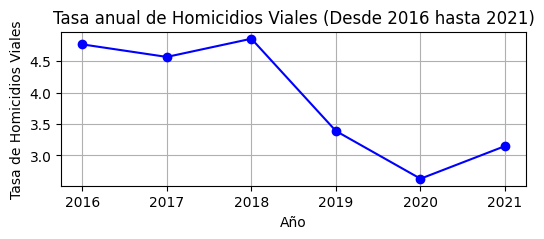

In [194]:

# Graficar la tasa de homicidios anuales
# Configurar el tamaño del gráfico
plt.figure(figsize=(6, 2))

# Crear el gráfico de líneas
plt.plot(poblacion_anual['AÑO'], poblacion_anual['TASA_HOMICIDIOS'], marker='o', linestyle='-', color='b')

# Agregar etiquetas a los ejes y un título
plt.xlabel('Año')
plt.ylabel('Tasa de Homicidios Viales')
plt.title('Tasa anual de Homicidios Viales (Desde 2016 hasta 2021)')

# Mostrar la cuadrícula
plt.grid(True)

# Mostrar el gráfico
plt.show()


# Análisis del gráfico:

El gráfico muestra la tasa anual de homicidios viales en la Ciudad Autónoma de Buenos Aires desde 2016 hasta 2021.
Se observa una tendencia decreciente en la tasa de homicidios viales a partir de 2018.
La tasa de homicidios viales en 2021 (3,2 por cada 100.000 habitantes) es la más baja registrada en el período analizado.
La reducción total en la tasa de homicidios viales entre 2018 y 2021 es del 31,8%.

--Esta reducción se atribuye principalmente a la implementación del Plan de Seguridad Vial del Gobierno de Buenos Aires, que incluye programas de educación vial para conductores, peatones y ciclistas.


--El Decreto 5954/2018 y su posterior implementación en 2019 han sido fundamentales para este logro.  Este plan ha permitido llevar a cabo campañas de concientización en escuelas y actividades de sensibilización pública sobre la importancia de respetar las normas de tráfico y las medidas de seguridad.

Además de la educación vial, otras variables que podrían haber contribuido a la reducción de la tasa de homicidios viales son la mejora de la infraestructura vial y la aplicación de la ley.

Para más información sobre el Plan de Seguridad Vial del Gobierno de Buenos Aires, consulte el siguiente enlace: https://buenosaires.gob.ar/movilidad/plan-de-seguridad-vial/educacion-para-la-movilidad-sustentable#:~:text=Docentes%3A%201%20Curso%20Educaci%C3%B3n%20Vial%20para%20la%20Movilidad,...%208%20Mi%20primera%20licencia%20...%20M%C3%A1s%20elementos

Por otro lado, también en necesario estimar la tasa de homicidios viales mensual porque ésta permite un seguimiento más detallado de la evolución de los homicidios viales en el corto plazo y la identificación de problemas emergentes.

    NOTA: Dado que no se tienen más datos se va a asumir que la cantidad total de la población no varió durante el año

In [195]:

# Agrupar las fechas por año y mes y cuenta cuántas hay en cada grupo
poblacion_mensual = homicidios_victimas.groupby(homicidios_victimas['FECHA'].dt.strftime('%Y-%m')).size().reset_index(name='HOMICIDIOS_VIALES')

# Cambiar el nombre de la columna para que todo continue estandarizado
poblacion_mensual.rename(columns={'FECHA':'MESES'}, inplace=True)

# Se pasa la columna a tipo datetime
meses = pd.to_datetime(poblacion_mensual['MESES'])

# Se asume que la población total no varía entre los meses en un año
pob = []
for i in range(len(poblacion_mensual)):
    for j in range(len(poblacion_anual)):
        if meses[i].year == poblacion_anual['AÑO'][j]:
            pob.append(poblacion_anual['POBLACION_TOTAL'][j])
poblacion_mensual['POBLACION_TOTAL'] = pob

# Calcular la tasa de homicidios viales por mes
rate = []
for i in range(len(poblacion_mensual)):
    rate.append(round((poblacion_mensual['HOMICIDIOS_VIALES'][i]/poblacion_mensual['POBLACION_TOTAL'][i])*100000,2))
poblacion_mensual['TASA_HOMICIDIOS'] = rate


# Mostrar el resultado 
poblacion_mensual


,MESES,HOMICIDIOS_VIALES,POBLACION_TOTAL,TASA_HOMICIDIOS
0,2016-01,8,3059122,0.26
1,2016-02,12,3059122,0.39
2,2016-03,13,3059122,0.42
3,2016-04,11,3059122,0.36
4,2016-05,7,3059122,0.23
...,...,...,...,...
67,2021-08,9,3078836,0.29
68,2021-09,4,3078836,0.13
69,2021-10,5,3078836,0.16
70,2021-11,8,3078836,0.26


Para el análisis de las tasas mensuales de homicidios viales, se utiliza un gráfico con un promedio móvil de 12 meses. Esta técnica permite identificar tendencias a largo plazo y suavizar las variaciones a corto plazo en los datos, lo que facilita la visualización de patrones y la comprensión de la evolución de la tasa de homicidios a lo largo del tiempo.

-- El promedio móvil se calcula promediando la tasa de homicidios viales de cada mes con los 11 meses anteriores. Esto ayuda a reducir el impacto de valores atípicos y eventos puntuales, y proporciona una mejor representación de la tendencia general.

-- El uso de un promedio móvil en este tipo de análisis presenta varias ventajas:

--Facilita la identificación de tendencias a largo plazo.
Suaviza las variaciones a corto plazo en los datos.
Permite una mejor comprensión de la evolución de la tasa de homicidios a lo largo del tiempo.
En resumen, el uso de un promedio móvil de 12 meses en el análisis de las tasas mensuales de homicidios viales es una herramienta útil para identificar tendencias, suavizar las variaciones a corto plazo y comprender la evolución de la tasa de homicidios a lo largo del tiempo.

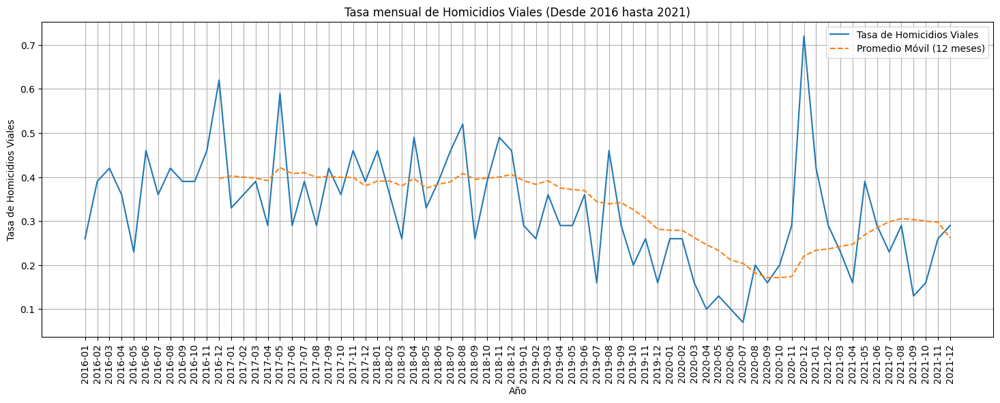

In [196]:
# Graficar la tasa de homicidios anuales
plt.figure(figsize=(18, 6))
poblacion_mensual['Promedio_Movil'] = poblacion_mensual['TASA_HOMICIDIOS'].rolling(window=12).mean()

plt.grid(True)
plt.xticks(rotation=90)

# Agregar nombres a los ejes
plt.xlabel('Año')
plt.ylabel('Tasa de Homicidios Viales')

# Agregar el promedio móvil al gráfico
plt.plot(poblacion_mensual['MESES'], poblacion_mensual['TASA_HOMICIDIOS'], label='Tasa de Homicidios Viales')
plt.plot(poblacion_mensual['MESES'], poblacion_mensual['Promedio_Movil'], label='Promedio Móvil (12 meses)', linestyle='--')

# Agregar título al gráfico
plt.title('Tasa mensual de Homicidios Viales (Desde 2016 hasta 2021)')

# Mostrar la leyenda
plt.legend()

# Mostrar el gráfico
plt.show()

Con el promedio móvil se puede ver que aún con el repunte en la tasa de homicidios viales en Diciembre de 2020 indica que aún hay falencias en la solución planteada.

-- También se puede observa una disminución en la tasa de homicidios viales desde la implementación del Decreto 5954/2018. Si bien este descenso es positivo, el aumento en la tasa de diciembre de 2020 indica que aún hay falencias en la solución planteada.

El análisis de la distribución horaria de los homicidios viales puede ayudar a identificar las causas de estos repuntes y a tomar medidas para prevenirlos. Comprender cuándo ocurren con mayor frecuencia puede ayudar a las autoridades a implementar medidas de seguridad pública específicas para esos períodos.



C:\Users\valen\AppData\Local\Temp\ipykernel_13548\778292416.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  homicidios_hechos['Hora'] = homicidios_hechos['Hora'].apply(


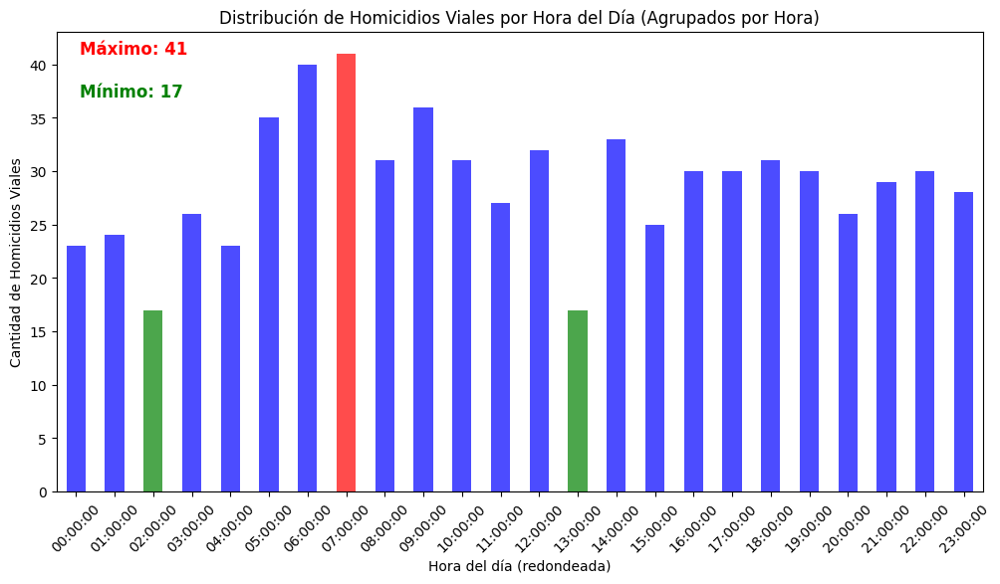

In [197]:
# Convertir la columna 'Hora' a objetos de tiempo
homicidios_hechos['Hora'] = pd.to_datetime(homicidios_hechos['Hora'], format='%H:%M:%S', errors='coerce').dt.time

# Filtrar valores NaT (No se puede formatear como hora)
homicidios_hechos = homicidios_hechos.dropna(subset=['Hora'])

# Redondear las horas al intervalo deseado (por ejemplo, al intervalo de 1 hora)
intervalo_horas = 1  # Cambia el intervalo según tu preferencia
homicidios_hechos['Hora'] = homicidios_hechos['Hora'].apply(
    lambda x: f"{x.hour // intervalo_horas * intervalo_horas:02d}:00:00"
)

# Contar la frecuencia de casos en cada hora
conteo_horas = homicidios_hechos['Hora'].value_counts().sort_index()

# Encuentra los valores máximos y mínimos
maximo = conteo_horas.max()
minimo = conteo_horas.min()

# Crea una lista de colores para los puntos máximos y mínimos
colores = ['red' if x == maximo else 'green' if x == minimo else 'blue' for x in conteo_horas]

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
conteo_horas.plot(kind='bar', color=colores, alpha=0.7)
plt.xlabel('Hora del día (redondeada)')
plt.ylabel('Cantidad de Homicidios Viales')
plt.title('Distribución de Homicidios Viales por Hora del Día (Agrupados por Hora)')
plt.xticks(rotation=45)

# Eliminar las cuadrículas o líneas del gráfico
plt.grid(False)

# Agregar comentarios
plt.text(0.1, maximo, f'Máximo: {maximo}', color='red', fontsize=12, fontweight='bold')
plt.text(0.1, minimo + 20, f'Mínimo: {minimo}', color='green', fontsize=12, fontweight='bold')

plt.show()

     NOTA: El rojo se asocia con peligro o alerta, el verde con seguridad o calma, y el azul con neutralidad. 


En nuestro análisis, las 5:00 PM se presenta como la hora con mayor riesgo de accidentes viales, con una diferencia de 41% respecto a otras horas del día, también podemos visualizar las horas de menor occurencia de homicidios viales son la 2:00 AM y la 1:00 PM

Esto coincide con recientes reportes, como el de La Nación, que indican que las horas pico en Buenos Aires se extienden desde la 1:00 PM hasta las 5:00 PM, lo que se refleja en un aumento de la cantidad de accidentes viales durante ese período.

Por lo tanto, a mayor cantidad de flujo vehicular, mayor es el riesgo de accidentes.


•	Explorar la ubicación de los homicidios en función de la comuna y el tipo de calle.

También es importante tener en cuenta el tipo de calle en el que se presentan más homicidios viales porque este es un indicador de que la infraestructura vial no es segura para los actores viales.

In [198]:
homicidios_hechos.head(1)

,Cantidad_victimas,Fecha,Hora,Tipo_de_calle,Calle,Cruce,Dirección_normalizada,Comuna,Longitud,Latitud,Victima,Acusado
0,1,2016-01-01,04:00:00,AVENIDA,PIEDRA BUENA AV.,SI,"PIEDRA BUENA AV. y FERNANDEZ DE LA CRUZ, F., G...",8,-58.47533969,-34.68757022,MOTO,AUTO


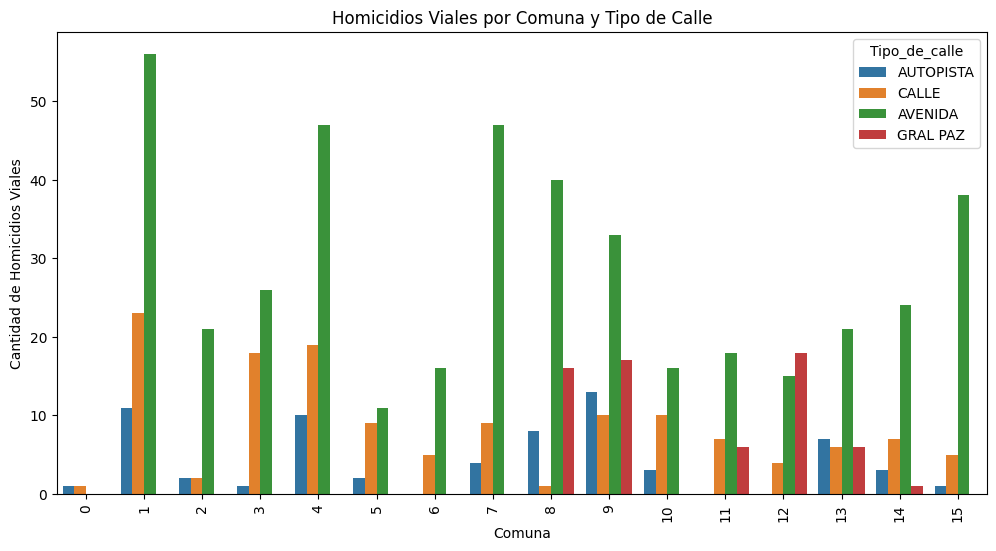

In [199]:


# Agrupar y contar los homicidios por comuna y tipo de calle
homicidios_por_comuna_tipo_calle = homicidios_hechos.groupby(['Comuna', 'Tipo_de_calle'])['Cantidad_victimas'].count().reset_index()

# Configurar el tamaño del gráfico
plt.figure(figsize=(12, 6))

# Crear el gráfico de barras agrupado
sns.barplot(data=homicidios_por_comuna_tipo_calle, x='Comuna', y='Cantidad_victimas', hue= 'Tipo_de_calle')
plt.title('Homicidios Viales por Comuna y Tipo de Calle')
plt.xlabel('Comuna')
plt.ylabel('Cantidad de Homicidios Viales')
plt.xticks(rotation=90)

# Mostrar el gráfico
plt.show()


Las avenidas, definidas como vías de circulación vehicular con más de dos carriles por sentido, presentan un mayor flujo de tráfico en comparación con otros tipos de calles. Además, son más comunes dentro de la ciudad, lo que aumenta las posibilidades de que ocurran accidentes de tránsito, incluidos los homicidios viales.

Llama la atención que en casi todas las comunas, a excepción de la comuna 12, la gran cantidad de homicidios viales ocurren en avenidas. Esto indica que es necesario revisar la calidad de dichas vías, incluyendo señalización, iluminación y estado del pavimento, o aumentar la presencia de supervisión vial en dichos sectores de la ciudad.

Por otro lado, la Comuna 1 registra la mayor cantidad de homicidios viales. Esta comuna, que alberga una gran cantidad de actividades culturales, comerciales y turísticas, es una de las áreas más transitadas de Buenos Aires.

--Esta alta concentración de actividades, sumada a la complejidad del tránsito en la zona, convierte a la Comuna 1 en un área de alto riesgo para los usuarios de las vías.

--Para reducir la cantidad de homicidios viales en las avenidas y en la Comuna 1, se recomienda:

Implementar medidas de control de velocidad.
Mejorar la señalización y el estado del pavimento.
Aumentar la presencia de agentes de tránsito.
Implementar campañas de concienciación vial.
Promover el uso de transporte público y alternativas de movilidad sostenible.

# Lesiones

    NOTA: En este apartado se siguió un proceso muy similar al ya realizado con los DataFrames de homicidios.

•	Calcular la tasa de lesiones viales (número de lesiones viales por año o mes) como un KPI para seguimiento.

Al igual que en el apartado anterior, se calcula la tasa anual y mensual, en este caso de lesiones.

In [200]:
# Agrupar la cantidad de casos de lesiones viales por año
contador = [0] * len(poblacion_anual)  # Crear una lista de ceros de la misma longitud que poblacion_anual

for i in range(len(lesiones_victimas)):
    for j in range(len(poblacion_anual)):
        if lesiones_victimas['FECHA'][i].year == poblacion_anual['AÑO'][j]:
            contador[j] += 1

# Crear una nueva columna en poblacion_anual con la lista contador
poblacion_anual['LESIONES_VIALES'] = contador

# Calcular la tasa de lesiones viales por año 
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['LESIONES_VIALES'][i] / poblacion_anual['POBLACION_TOTAL'][i]) * 100000, 2))
poblacion_anual['TASA_LESIONES'] = rate
poblacion_anual

,AÑO,POBLACION_TOTAL,HOMICIDIOS_VIALES,TASA_HOMICIDIOS,LESIONES_VIALES,TASA_LESIONES
0,2016,3059122,146,4.77,0,0.00
1,2017,3063728,140,4.57,0,0.00
2,2018,3068043,149,4.86,0,0.00
3,2019,3072029,104,3.39,11793,383.88
4,2020,3075646,81,2.63,6855,222.88
5,2021,3078836,97,3.15,8957,290.92


In [201]:

# Crear una lista vacía para almacenar los valores calculados
contador = []

# Iterar a través de los datos de lesiones_victimas y poblacion_anual
for i in range(len(poblacion_anual)):
    year = poblacion_anual['AÑO'][i]
    # Calcular la cantidad de lesiones para el año actual (year)
    lesiones_para_este_año = sum(1 for fecha in lesiones_victimas['FECHA'] if fecha.year == year)
    contador.append(lesiones_para_este_año)

# Agregar la lista de lesiones al DataFrame poblacion_anual
poblacion_anual['LESIONES_VIALES'] = contador

# Calcular la tasa de lesiones viales
poblacion_anual['TASA_LESIONES'] = round((poblacion_anual['LESIONES_VIALES'] / poblacion_anual['POBLACION_TOTAL']) * 100000,2)
poblacion_anual


,AÑO,POBLACION_TOTAL,HOMICIDIOS_VIALES,TASA_HOMICIDIOS,LESIONES_VIALES,TASA_LESIONES
0,2016,3059122,146,4.77,0,0.00
1,2017,3063728,140,4.57,0,0.00
2,2018,3068043,149,4.86,0,0.00
3,2019,3072029,104,3.39,11793,383.88
4,2020,3075646,81,2.63,6855,222.88
5,2021,3078836,97,3.15,8957,290.92


    NOTA: Recuérdese que la tasa de lesiones no es porcentual. La tasa de 383.88 indica que, en promedio, hubo aproximadamente 383.88 lesiones viales por cada 100,000 habitantes en 2019.

•	Analizar la distribución de la hora y el día de la semana en que ocurren las lesiones viales.

In [202]:
lesiones_hechos

,n_victimas,fecha,hora,comuna,tipo_calle,longitud,latutid,victima,acusado,gravedad
0,1,2019-01-01,09:00:00,14,SD,-58.408911,-34.559658,CICLISTA,SD,SD
1,1,2019-01-01,01:55:00,8,SD,-58.44351,-34.669125,AUTO,SD,SD
2,1,2019-01-01,02:00:00,8,SD,-58.468335,-34.677556,SD,SD,SD
3,1,2019-01-01,02:30:00,7,SD,-58.437425,-34.647349,PEATON,SD,SD
4,4,2019-01-01,04:30:00,3,SD,-58.398225,-34.604579,AUTO,SD,SD
...,...,...,...,...,...,...,...,...,...,...
23780,1,2021-12-31,19:30:00,9,AVENIDA,-58.513477158887,-34.659713573880,SD,SD,SD
23781,2,2021-12-31,19:40:00,9,AVENIDA,-58.488326609395,-34.641753304864,SD,SD,SD
23782,1,2021-12-31,20:00:00,1,SD,-58.382894,-34.583083,SD,SD,SD
23783,1,2021-12-31,22:00:00,5,CALLE,-58.414532050899,-34.614288229345,MOTO,TRANSPORTE PUBLICO,GRAVE


In [203]:
# Convertir la columna 'hora' a datetime nuevamente si aún no lo has hecho
lesiones_hechos['hora'] = pd.to_datetime(lesiones_hechos['hora'], errors='coerce')

# Redondear las horas al intervalo deseado (por ejemplo, al intervalo de 1 hora)
intervalo_horas = 1

# Manejar los valores NaN antes de realizar la operación
lesiones_hechos['hora'] = lesiones_hechos['hora'].apply(
    lambda x: f"{int(x.hour // intervalo_horas) * intervalo_horas:02d}:00:00" if not pd.isnull(x) else np.nan
)

# Contar la frecuencia de casos en cada hora
conteo_horas = lesiones_hechos['hora'].value_counts().sort_index()


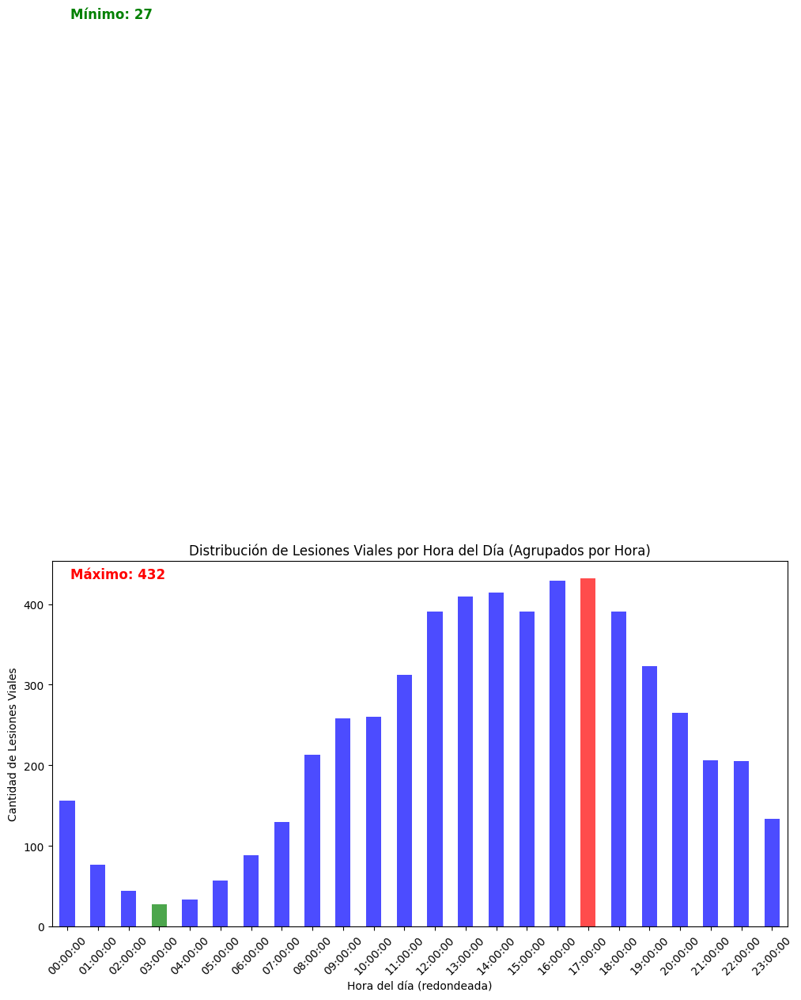

In [204]:

# Encuentra los valores máximos y mínimos
maximo = conteo_horas.max()
minimo = conteo_horas.min()

# Crea una lista de colores para los puntos máximos y mínimos
colores = ['red' if x == maximo else 'green' if x == minimo else 'blue' for x in conteo_horas]

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))
conteo_horas.plot(kind='bar', color=colores, alpha=0.7)
plt.xlabel('Hora del día (redondeada)')
plt.ylabel('Cantidad de Lesiones Viales')
plt.title('Distribución de Lesiones Viales por Hora del Día (Agrupados por Hora)')
plt.xticks(rotation=45)

# Eliminar las cuadrículas o líneas del gráfico
plt.grid(False)

# Agregar comentarios
plt.text(0.1, maximo, f'Máximo: {maximo}', color='red', fontsize=12, fontweight='bold')
plt.text(0.1, minimo + 1100, f'Mínimo: {minimo}', color='green', fontsize=12, fontweight='bold')

plt.show()

Análisis del pico de lesiones viales en Buenos Aires

En contraste con la distribución de homicidios, el mayor número de lesiones viales se observa alrededor de las 5:00 PM. Esta tendencia coincide con reportes recientes que señalan que las horas pico en Buenos Aires se extienden desde la 1:00 PM hasta las 5:00 PM, tal como se aprecia en el gráfico presentado. La correlación entre el aumento del flujo vehicular y el pico de lesiones viales es evidente, lo que sugiere una relación directa entre ambos fenómenos.

Fuente: https://www.lanacion.com.ar/buenos-aires/fin-de-la-hora-pico-cuales-son-los-horarios-con-mayor-circulacion-de-vehiculos-en-las-autopistas-y-nid04092023/

--Recomendaciones:

-Implementar campañas de concienciación vial: Enfocarse en la responsabilidad al volante durante las horas pico.

-Fortalecer la presencia de agentes de tránsito: Supervisar y controlar el flujo vehicular en zonas de alto riesgo.

-Mejorar la señalización vial: Asegurar una adecuada visibilidad y comprensión de las normas de tránsito.

-Promover el uso de transporte alternativo: Reducir la cantidad de vehículos en circulación durante las horas pico.


Para el caso puntual de las lesiones también vamos a tomar en cuenta en qué dias de la semana se presentan más frecuentemente. Esto es importante para proteger a los actores viales que más trancitan en esos dias.

In [205]:
# Identificar el día de la semana para cada lesión
lesiones_victimas['DIA_SEMANA'] = lesiones_victimas['FECHA'].dt.dayofweek
conteo_dias_semana = lesiones_victimas['DIA_SEMANA'].value_counts().sort_index()

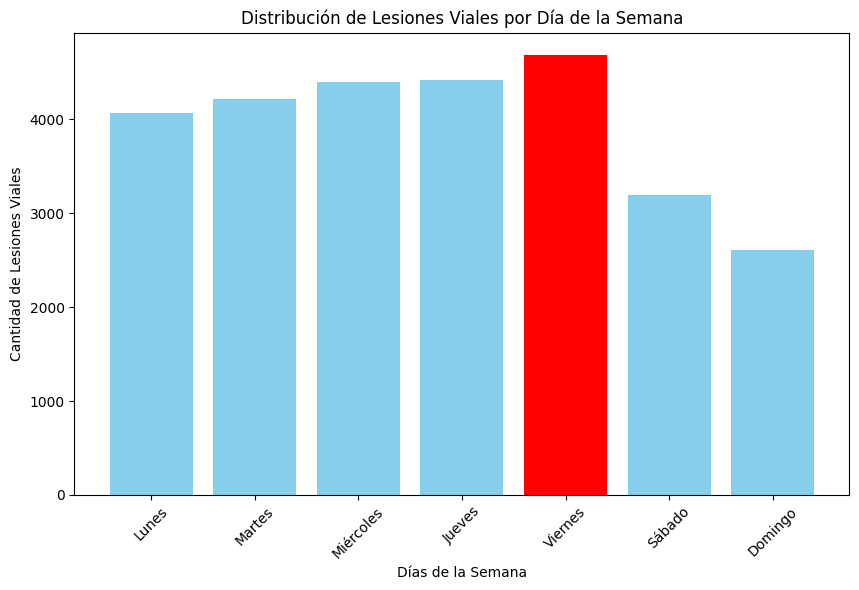

In [206]:

# Obtener el valor máximo y su índice
maximo = conteo_dias_semana.max()
indice_maximo = conteo_dias_semana.idxmax()

# Definir los nombres de los días de la semana
nombres_dias_semana = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']

# Crear una lista de colores donde todas las barras sean azules, excepto la barra máxima que será roja
colores = ['red' if i == indice_maximo else 'skyblue' for i in range(7)]

# Crear el gráfico de barras con colores personalizados
plt.figure(figsize=(10, 6))  
plt.bar(range(7), conteo_dias_semana, color=colores)
plt.xlabel('Días de la Semana')
plt.ylabel('Cantidad de Lesiones Viales')
plt.title('Distribución de Lesiones Viales por Día de la Semana')
plt.xticks(range(7), nombres_dias_semana, rotation=45)

# Mostrar el gráfico
plt.show()

Si bien la etiología de los accidentes de tráfico y las lesiones viales es multicausal, este análisis se centra en dos factores relevantes: el aumento de las actividades sociales y recreativas los días viernes y la mayor actividad laboral durante la semana.

-- El fin de semana comienza para muchos el día viernes, lo que genera un incremento en las actividades sociales y recreativas. Esto se traduce en un mayor número de personas en las calles, aumentando las posibilidades de accidentes de tráfico y, por ende, de lesiones viales.

En términos generales, las lesiones viales tienen mayor incidencia en los días laborales (de lunes a jueves). Este fenómeno se explica por el aumento del tráfico vehicular asociado a la actividad laboral, lo que incrementa el riesgo de colisiones y otros eventos viales.

•	Explorar la distribución por tipo de vehículo involucrado.

 Al conocer los tipos de vehículos más propensos a estar involucrados en lesiones viales, las autoridades y las organizaciones de seguridad vial pueden implementar medidas específicas de prevención y regulación. Por ejemplo, pueden establecer límites de velocidad adecuados para ciertos tipos de vehículos o diseñar campañas de concientización dirigidas a conductores de vehículos específicos.

<Figure size 800x400 with 0 Axes>

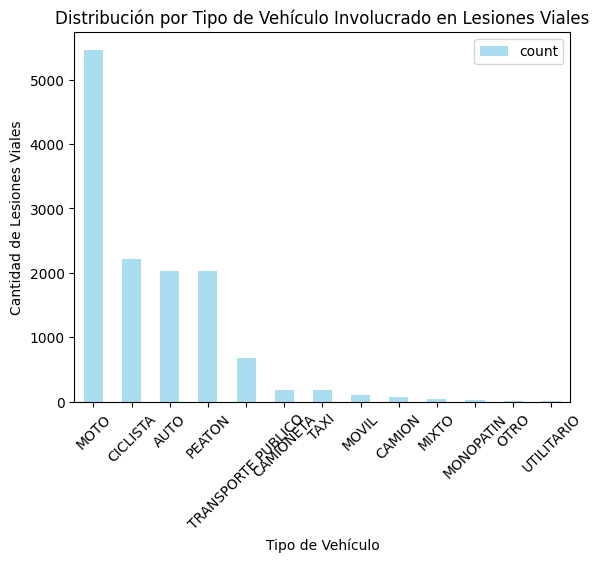

In [207]:

# Calcular la frecuencia de cada tipo de vehículo
conteo_tipo_vehiculo = lesiones_hechos['victima'].value_counts()

# Como SD es "Sin Datos" entonces esto se elimina del análisis
conteo_tipo_vehiculo = pd.DataFrame(conteo_tipo_vehiculo)
conteo_tipo_vehiculo = conteo_tipo_vehiculo.drop('SD', axis=0)

# Crear el gráfico de barras
plt.figure(figsize=(8, 4))
conteo_tipo_vehiculo.plot(kind='bar', color='skyblue', alpha=0.7)
plt.xlabel('Tipo de Vehículo')
plt.ylabel('Cantidad de Lesiones Viales')
plt.title('Distribución por Tipo de Vehículo Involucrado en Lesiones Viales')
plt.xticks(rotation=45)

# Mostrar el gráfico
plt.show()

Es notorio que la mayoría de las lesiones viales se producen en motocicletas, y esto puede atribuirse a varias razones. Las motocicletas, por su alta maniobrabilidad, se desplazan con agilidad entre el tráfico. Sin embargo, esta ventaja se convierte en un riesgo significativo si no se conduce con precaución, incrementando exponencialmente la probabilidad de colisiones y caídas, con graves consecuencias para la salud e incluso la vida de los conductores.

--Factores que aumentan el riesgo:

Exceso de velocidad: Los motociclistas que superan los límites de velocidad ponen en peligro su vida y la de los demás.
Omisión del uso del casco: El casco, una medida de protección vital, puede evitar lesiones graves en caso de accidente. Su uso no es una opción, sino una obligación irrenunciable.
Conducción imprudente: No respetar las normas de tráfico, como adelantar por la derecha o zigzaguear entre los autos, aumenta considerablemente el riesgo de accidentes.

--Es crucial subrayar la importancia de que los motociclistas respeten los límites de velocidad y que sigan las normas de tráfico para mantener la seguridad vial, esto se puede controlar con cámaras o detectores de velocidad en zonas estrategicas  (como en las avenidas), así como capacitaciones en seguridad vial específicamente para motociclistas.

# 3. Análisis de víctimas.

•	Analizar la distribución de edades y sexos de las víctimas en ambos conjuntos de datos.

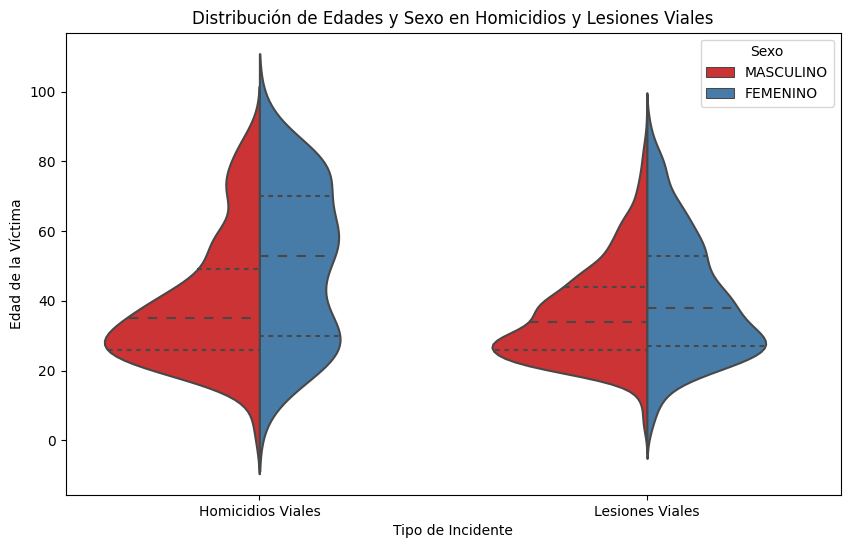

In [208]:

# Crear un nuevo DataFrame paraa organizar los datos para el gráfico
df = pd.concat([homicidios_victimas.assign(Tipo='Homicidios Viales'), lesiones_victimas.assign(Tipo='Lesiones Viales')])

# Reemplazar los valores NaN en 'EDAD_VICTIMA' por 0 (o cualquier otro valor deseado)
df['EDAD_VICTIMA'].fillna(0, inplace=True)

# Convertir la columna 'EDAD_VICTIMA' a tipo numérico
df['EDAD_VICTIMA'] = pd.to_numeric(df['EDAD_VICTIMA'], errors='coerce')

# Filtrar los valores no deseados en la columna 'EDAD_VICTIMA'
df = df[df['EDAD_VICTIMA'] > 0]

# Crear el gráfico de violín
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='Tipo', y='EDAD_VICTIMA', hue='SEXO', split=True, inner='quart', palette='Set1')
plt.xlabel('Tipo de Incidente')
plt.ylabel('Edad de la Víctima')
plt.title('Distribución de Edades y Sexo en Homicidios y Lesiones Viales')
plt.legend(title='Sexo', loc='upper right')
plt.show()

Los datos sobre sexo y edad de las víctimas son fundamentales para el desarrollo de políticas públicas y medidas de seguridad eficaces. Al comprender las características demográficas de las personas más afectadas por los accidentes de tráfico, podemos implementar estrategias específicas y focalizadas que reduzcan la siniestralidad vial.

Información clave del gráfico:

Este gráfico revela que un grupo demográfico particular, compuesto por jóvenes adultos de ambos sexos (entre 20 y 40 años), presenta una alta probabilidad de sufrir un accidente de tráfico.

--Oportunidades para la acción:

Este hallazgo abre la puerta a la implementación de programas de educación vial específicos para este grupo poblacional. Estos programas podrían incluir:

Campañas de concienciación sobre los riesgos y consecuencias de la conducción imprudente.
Capacitaciones en técnicas de conducción segura y responsable.
Talleres sobre primeros auxilios en caso de accidentes.

    NOTA: Hasta el momento los "SD" se estaban ignorando pero para efectos de este análisis van a ser tomados en cuenta.

En este caso se va a realizar la Prueba de Chi Cuadrado porque esta puede ayudar a identificar si existe una asociación significativa entre la gravedad de las lesiones y el tipo de actor vial (por ejemplo, peatones, ciclistas, conductores de automóviles, etc.). Si existe una asociación significativa, esto sugiere que el tipo de actor vial y la gravedad de las lesiones no son independientes, lo que es información importante.

C:\Users\valen\AppData\Local\Temp\ipykernel_13548\3828683994.py:12: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=expected_df, palette="Set1", ci=None)


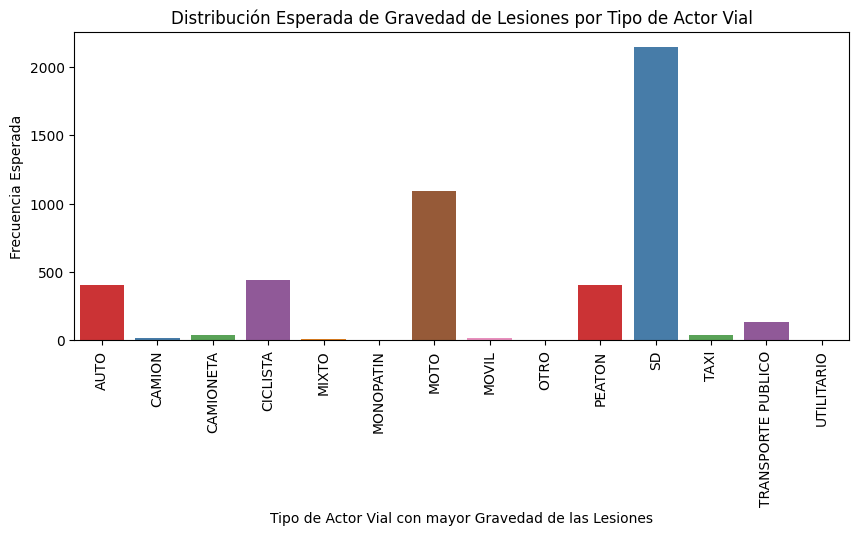

In [209]:

# Crear una tabla de contingencia
contingency_table = pd.crosstab(lesiones_hechos['gravedad'], lesiones_hechos['victima'])

# Realizar la prueba de chi-cuadrado
chi2, p, dof, expected = chi2_contingency(contingency_table)

# Crear un DataFrame para los resultados esperados
expected_df = pd.DataFrame(expected, columns=contingency_table.columns, index=contingency_table.index)

# Crear el gráfico de barras apiladas
plt.figure(figsize=(10, 4))
sns.barplot(data=expected_df, palette="Set1", ci=None)
plt.xticks(rotation=90)
plt.xlabel('Tipo de Actor Vial con mayor Gravedad de las Lesiones')
plt.ylabel('Frecuencia Esperada')
plt.title('Distribución Esperada de Gravedad de Lesiones por Tipo de Actor Vial')
plt.show()

La falta de datos dificulta la lucha contra los accidentes de tránsito en Buenos Aires:

El gráfico presentado revela una preocupante realidad: se registra una cantidad considerable de accidentes de tránsito de gravedad, pero no se están recopilando los datos necesarios para llevar un control efectivo. Esta situación impide identificar zonas de riesgo, implementar medidas de prevención y evaluar la eficacia de las políticas públicas. Es urgente fortalecer las entidades encargadas de la recolección de datos en la Ciudad de Buenos Aires.

Los motociclistas, un grupo vulnerable en las calles:

Las lesiones graves en motociclistas son significativamente más elevadas que las de otros actores viales. Esta alarmante realidad exige medidas urgentes. Se deben implementar capacitaciones específicas para motociclistas en materia de seguridad vial, y endurecer las sanciones para quienes no usen los elementos de protección personal.

Es hora de actuar:

Solo con datos precisos y medidas contundentes podremos reducir los accidentes de tránsito y proteger la vida de todos los actores viales en Buenos Aires. Te invitamos a unirte a la acción y exigir a las autoridades las medidas necesarias para mejorar la seguridad vial en nuestra ciudad.

In [227]:

# Elimina filas con valores NaN en las columnas 'Latitud' y 'Longitud'
homicidios_hechos = homicidios_hechos.dropna(subset=['Latitud', 'Longitud'])

# Convierte las columnas 'Latitud' y 'Longitud' a tipo numérico si no lo son
homicidios_hechos['Latitud'] = pd.to_numeric(homicidios_hechos['Latitud'], errors='coerce')
homicidios_hechos['Longitud'] = pd.to_numeric(homicidios_hechos['Longitud'], errors='coerce')

# Elimina filas con valores NaN en las columnas 'Latitud' y 'Longitud' nuevamente
homicidios_hechos = homicidios_hechos.dropna(subset=['Latitud', 'Longitud'])


# Los pasos que se siguieron  antes de empezar a hacer la Creación de KPIs y Métricas claves

- Bibliotecas necesarias importadas
- Cargué los conjuntos de datos 'homicidios.xlsx' y 'lesiones.xlsx' en DataFrames
- Limpié y preprocesé los conjuntos de datos eliminando columnas innecesarias, cambiando el nombre de las columnas, reemplazando los valores faltantes y convirtiendo tipos de datos.
- Realicé análisis de datos exploratorios EDA (histogramas, diagramas de caja, etc) para comprender la distribución, las tendencias y los patrones en los datos.
- Analizó la tasa de homicidios viales y la trazó a lo largo del tiempo.


# 5. Creación de KPIs y Métricas Clave

Esta seccion es importante porque los KPIs se pueden alinear con los objetivos estratégicos de seguridad vial de la ciudad o la región. Esto ayuda a garantizar que las medidas implementadas estén en consonancia con los objetivos de reducción de accidentes y víctimas fatales.

* El Ministerio de Seguridad de la Nación se propuso reducir en un 10% la tasa de homicidios en siniestros viales de los últimos seis meses, en CABA, en comparación con la tasa de homicidios en siniestros viales del semestre anterior.

In [212]:
#Calcular el número total de víctimas en el conjunto de datos
total_victims = homicidios_victimas['VICTIMA'].count()
total_victims


717

In [213]:
# Calcular la cantidad promedio de víctimas por homicidio
avg_victims_per_homicide = homicidios_hechos['Cantidad_victimas'].mean()
avg_victims_per_homicide


1.0292825768667642

In [214]:

# Calcular la tasa de homicidios viales para cada semestre 
poblacion_semestral = pd.DataFrame()
poblacion_semestral['SEMESTRES'] = ['2016-1','2016-2','2017-1','2017-2','2018-1','2018-2','2019-1','2019-2','2020-1','2020-2','2021-1','2021-2']
poblacion_semestral['INICIO_SEMESTRE'] = pd.to_datetime(['2016-01-01','2016-07-01','2017-01-01','2017-07-01','2018-01-01','2018-07-01','2019-01-01','2019-07-01','2020-01-01','2020-07-01','2021-01-01','2021-07-01'])
poblacion_semestral['FIN_SEMESTRE'] = pd.to_datetime(['2016-06-30','2016-12-31','2017-06-30','2017-12-31','2018-06-30','2018-12-31','2019-06-30','2019-12-31','2020-06-30','2020-12-31','2021-06-30','2021-12-31'])

tot_pob = []
for i in range(len(poblacion_semestral)):
    for j in range(len(poblacion_anual)):
        if poblacion_semestral['INICIO_SEMESTRE'][i].year == poblacion_anual['AÑO'][j]:
            tot_pob.append(poblacion_anual['POBLACION_TOTAL'][j])
poblacion_semestral['POBLACION_TOTAL'] = tot_pob

# Agrupa la cantidad de casos de homicidio vial por semestre
contador = list(np.zeros(len(poblacion_semestral)))

for i in range(len(homicidios_victimas)):
    for j in range(len(poblacion_semestral)):
        # Verifica si la fecha del homicidio está dentro del semestre correspondiente
        fecha_homicidio = homicidios_victimas['FECHA'][i]
        inicio_semestre = poblacion_semestral['INICIO_SEMESTRE'][j]
        fin_semestre = poblacion_semestral['FIN_SEMESTRE'][j]

        if inicio_semestre <= fecha_homicidio <= fin_semestre:
            contador[j] += 1
            contador[j] = int(contador[j])

poblacion_semestral['HOMICIDIOS_VIALES'] = contador

# Calcula la tasa de homicidios viales por semestre
rate = []

for i in range(len(poblacion_semestral)):
    rate.append(round((poblacion_semestral['HOMICIDIOS_VIALES'][i] / poblacion_semestral['POBLACION_TOTAL'][i]) * 100000, 2))

poblacion_semestral['TASA_HOMICIDIOS'] = rate

In [215]:

# Ahora se calcula la variación porcentual entre semestres para la tasa de homicidios 
var = ['-']
for i in range(1,len(poblacion_semestral)):
    tasa_actual = poblacion_semestral['TASA_HOMICIDIOS'][i]
    tasa_anterior = poblacion_semestral['TASA_HOMICIDIOS'][i-1]
    # Calcula la variación porcentual
    variacion_porcentual = ((tasa_actual - tasa_anterior) / tasa_anterior) * 100
    var.append(variacion_porcentual)

poblacion_semestral['VARIACIÓN_PORCENTUAL'] = var

In [216]:

# Ahora se calcula la variación porcentual entre semestres para la tasa de homicidios 
var = ['-']
for i in range(1,len(poblacion_semestral)):
    tasa_actual = poblacion_semestral['TASA_HOMICIDIOS'][i]
    tasa_anterior = poblacion_semestral['TASA_HOMICIDIOS'][i-1]
    # Calcula la variación porcentual
    variacion_porcentual = ((tasa_actual - tasa_anterior) / tasa_anterior) * 100
    var.append(variacion_porcentual)

poblacion_semestral['VARIACIÓN_PORCENTUAL'] = var
poblacion_semestral[['SEMESTRES','HOMICIDIOS_VIALES','TASA_HOMICIDIOS','VARIACIÓN_PORCENTUAL']]


,SEMESTRES,HOMICIDIOS_VIALES,TASA_HOMICIDIOS,VARIACIÓN_PORCENTUAL
0,2016-1,65,2.12,-
1,2016-2,81,2.65,25.0
2,2017-1,69,2.25,-15.09434
3,2017-2,71,2.32,3.111111
4,2018-1,70,2.28,-1.724138
5,2018-2,79,2.57,12.719298
6,2019-1,57,1.86,-27.626459
7,2019-2,47,1.53,-17.741935
8,2020-1,31,1.01,-33.986928
9,2020-2,50,1.63,61.386139


Reducción de la tasa de homicidios viales en CABA:

La tasa de homicidios viales en CABA experimentó una notable disminución del 24,02% en el último semestre. Este logro, que representa un descenso de la tasa de 1,79 a 1,36, es producto del trabajo conjunto de las autoridades, las organizaciones de la sociedad civil y la comunidad en general.

Sin embargo, aún queda mucho por hacer. 42 familias se vieron afectadas por la pérdida de un ser querido en siniestros viales durante el último semestre. Es por ello que es fundamental continuar trabajando para reducir aún más esta cifra.

Un objetivo clave es reducir en un 7% la cantidad de accidentes mortales de motociclistas en el último año. Esta meta es crucial, ya que casi la mitad de las víctimas fatales en siniestros viales son motociclistas.

--Para alcanzar este objetivo, se están implementando diversas medidas, como:

-Campañas de concienciación vial dirigidas a motociclistas.

-Endurecimiento de las sanciones para quienes no respeten las normas de tránsito.

-Capacitaciones en seguridad vial para motociclistas.

Es necesario el compromiso de todos para lograr un cambio cultural en materia de seguridad vial. Solo así podremos evitar que más familias sufran la pérdida de un ser querido en un accidente de tránsito.

In [217]:

# Primero se calcula la tasa anual de homicidios viales en motociclistas 
contador = list(np.zeros(len(poblacion_anual)))
for i in range(len(homicidios_victimas)):
    for j in range(len(poblacion_anual)):
        if homicidios_victimas['FECHA'][i].year == poblacion_anual['AÑO'][j] and homicidios_victimas['VICTIMA'][i] == "MOTO":
            contador[j] += 1
            contador[j] = int(contador[j])
poblacion_anual['HOMICIDIOS_MOTOS'] = contador

# Calcular la tasa de homicidios viales por año 
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['HOMICIDIOS_MOTOS'][i]/poblacion_anual['POBLACION_TOTAL'][i])*100000,2))
poblacion_anual['TASA_H_MOTOS'] = rate

In [218]:

# Primero se calcula la tasa anual de homicidios viales en motociclistas 
contador = list(np.zeros(len(poblacion_anual)))
for i in range(len(homicidios_victimas)):
    for j in range(len(poblacion_anual)):
        if homicidios_victimas['FECHA'][i].year == poblacion_anual['AÑO'][j] and homicidios_victimas['VICTIMA'][i] == "MOTO":
            contador[j] += 1
            contador[j] = int(contador[j])
poblacion_anual['HOMICIDIOS_MOTOS'] = contador

# Calcular la tasa de homicidios viales por año 
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['HOMICIDIOS_MOTOS'][i]/poblacion_anual['POBLACION_TOTAL'][i])*100000,2))
poblacion_anual['TASA_H_MOTOS'] = rate

# Ahora se calcula la variación porcentual entre años para la tasa de homicidios viales en motos
var = ['-']
for i in range(1,len(poblacion_anual)):
    tasa_actual = poblacion_anual['TASA_HOMICIDIOS'][i]
    tasa_anterior = poblacion_anual['TASA_HOMICIDIOS'][i-1]
    # Calcula la variación porcentual
    variacion_porcentual = ((tasa_actual - tasa_anterior) / tasa_anterior) * 100
    var.append(variacion_porcentual)

poblacion_anual['VAR_PORC_MOTOS'] = var

In [219]:
poblacion_anual[['AÑO','HOMICIDIOS_MOTOS','TASA_H_MOTOS','VAR_PORC_MOTOS']]

,AÑO,HOMICIDIOS_MOTOS,TASA_H_MOTOS,VAR_PORC_MOTOS
0,2016,65,2.12,-
1,2017,56,1.83,-4.192872
2,2018,57,1.86,6.345733
3,2019,50,1.63,-30.246914
4,2020,29,0.94,-22.418879
5,2021,46,1.49,19.771863


Aumento de la tasa de homicidios viales en motociclistas en 2021:

En 2021, la tasa de homicidios viales en motociclistas experimentó un preocupante aumento del 19,77%, pasando de 0,94 a 1,49 muertes por cada 100.000 habitantes. Esta situación exige medidas urgentes para proteger la vida de este grupo vulnerable.

Para reducir la tasa de homicidios viales en las avenidas, se propone:

Reducir la tasa anual de homicidios viales en las avenidas en un 20% con respecto al año anterior.
Este objetivo se basa en el análisis de la ubicación de los homicidios viales, que revela que las avenidas son los lugares donde más ocurren siniestros viales fatales.

In [220]:

# Hay que resetear los índices en este dataframe
homicidios_hechos = homicidios_hechos.reset_index(drop=True)

# Primero se calcula la tasa anual de homicidios viales en avenidas 

contador = list(np.zeros(len(poblacion_anual)))
for i in range(len(homicidios_hechos)):
    for j in range(len(poblacion_anual)):
        if homicidios_hechos['Fecha'][i].year == poblacion_anual['AÑO'][j] and homicidios_hechos['Tipo_de_calle'][i] == "AVENIDA":
            contador[j] += 1
            contador[j] = int(contador[j])
poblacion_anual['HOMICIDIOS_AVENIDA'] = contador

# Calcular la tasa de homicidios en avenidas por año 
rate = []
for i in range(len(poblacion_anual)):
    rate.append(round((poblacion_anual['HOMICIDIOS_AVENIDA'][i]/poblacion_anual['POBLACION_TOTAL'][i])*100000,2))
poblacion_anual['TASA_H_AVENIDA'] = rate

In [221]:

# Ahora se calcula la variación porcentual entre años para la tasa de homicidios viales en motos
var = ['-']
for i in range(1,len(poblacion_anual)):
    tasa_actual = poblacion_anual['HOMICIDIOS_AVENIDA'][i]
    tasa_anterior = poblacion_anual['HOMICIDIOS_AVENIDA'][i-1]
    # Calcula la variación porcentual
    variacion_porcentual = ((tasa_actual - tasa_anterior) / tasa_anterior) * 100
    var.append(variacion_porcentual)

poblacion_anual['VAR_PORC_AVENIDA'] = var

En los últimos años, la tasa de homicidios viales en las avenidas ha experimentado fluctuaciones significativas. Lamentablemente, el año pasado no se logró cumplir con el objetivo de reducirla. Sin embargo, estamos comprometidos con la seguridad vial y confiamos en que, a través de un conjunto de medidas estratégicas, podremos revertir esta tendencia.

# Análisis espacial

In [228]:
# Crea el mapa después de limpiar y convertir los datos
mapa = folium.Map(location=[-34.599722222222, -58.381944444444], zoom_start=12)

# Agrega marcadores para cada siniestro vial en el DataFrame 'lesiones_victimas'
for index, row in homicidios_hechos.iterrows():
    latitud = row['Latitud']
    longitud = row['Longitud']
    descripcion = f'Número de Víctimas: {row["Cantidad_victimas"]}'  # Puedes personalizar la información mostrada en el marcador
    folium.Marker([latitud, longitud], tooltip=descripcion).add_to(mapa)

# Guarda el mapa en un archivo HTML o muestra el mapa en Jupyter Notebook
mapa.save('mapa_homicides_and_injuries.html')

#Visualizar Mapa
mapa

    NOTA: El mapa se genera y se archiva de manera local.

En el mapa se puede notar que prácticamente en cualquier punto de la Avenida General Paz se presenta una alta accidentalidad, es importante colocar cámaras de control de velocidad y más presencia policial a lo largo de toda la Avenida. 

In [229]:
# Guarde los DataFrames como archivos CSV
homicidios_hechos.to_csv('homicidios_data.csv', index=False)
lesiones_hechos.to_csv('lesiones_data.csv', index=False)

# Pasos que se siguieron para los KPIs

- Se creó un KPI para rastrear la reducción de homicidios viales en un 10% en los últimos seis meses respecto a los seis meses anteriores en CABA
- Se creó un KPI para rastrear la reducción de accidentes mortales de motociclistas en un 7% en el último año respecto al año anterior en CABA
- Investigó la tasa anual de homicidios viales en motos y su variación porcentual
- Se examinó la tasa anual de homicidios viales en las avenidas y su variación porcentual.

# 6. Conclusiones y sugerencias:

Este proyecto de análisis de datos se presenta como una herramienta valiosa para contribuir a la mejora de la seguridad vial en la Ciudad de Buenos Aires. Los resultados obtenidos ofrecen una base sólida para la implementación de políticas públicas y acciones concretas que apunten a la reducción de víctimas fatales en siniestros viales, protegiendo la vida de los ciudadanos.

A partir del análisis realizado, se proponen las siguientes medidas:

* 1. Fortalecimiento de las capacitaciones:

Continuidad y periodicidad: Mantener las capacitaciones segmentadas por edades, brindándolas al menos una vez al año a toda la comunidad.
Ampliación del enfoque: Incluir en las capacitaciones información sobre la importancia del buen descanso para prevenir siniestros viales por somnolencia, especialmente en las primeras horas del día.

* 2. Refuerzo del control y la vigilancia:

Incrementar la presencia policial: Priorizar la Comuna 1, con mayor concentración de siniestros viales, y aumentar la presencia de autoridades viales en las horas pico para garantizar un flujo vehicular seguro.

* 3. Inversión en infraestructura:

Destinar recursos a la mejora de la infraestructura vial: Implementar mejoras en las avenidas de todas las comunas.

* 4. Implementación de tecnología:

Utilizar herramientas tecnológicas: Instalar cámaras o detectores de velocidad en zonas estratégicas para el control del tránsito.

* 5. Foco en motociclistas:

Capacitaciones específicas: Implementar programas de formación en seguridad vial especialmente dirigidos a motociclistas.
Control del uso del casco: Intensificar el control y, en caso necesario, aplicar multas por no llevarlo correctamente.

* 6. Recopilación y análisis de datos:

Fortalecimiento de las entidades: Mejorar las capacidades de las entidades encargadas de la recopilación de datos o crear un grupo especializado en siniestros viales.
Monitoreo constante: Mantener una vigilancia permanente del comportamiento de los conductores en la Avenida General Paz.
La implementación de estas medidas, junto con un compromiso sostenido por parte de todos los actores viales, permitirá avanzar hacia un tránsito más seguro y responsable en la Ciudad de Buenos Aires.



    En resumen, para reducir la tasa de homicidios viales en las avenidas, es necesario implementar un enfoque integral que combine medidas de concientización, seguridad vial, prevención del delito y sanciones más severas. Estas medidas podrían generar un impacto significativo en la reducción de la tasa de homicidios viales en las avenidas y mejorar la seguridad vial en general.